In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


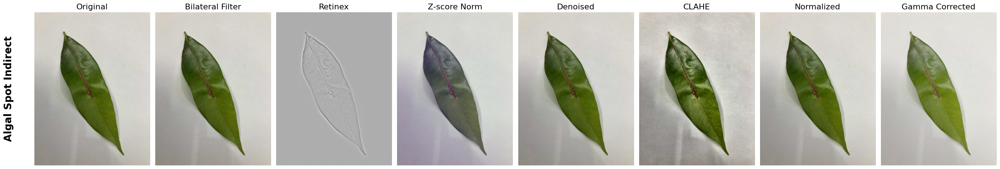

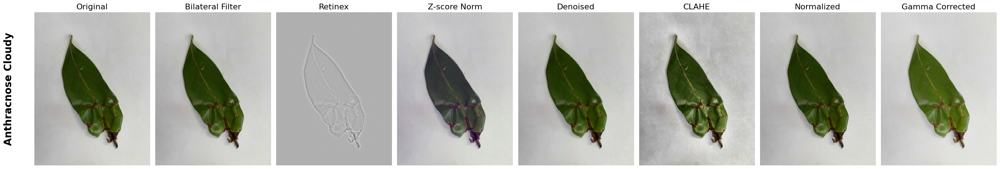

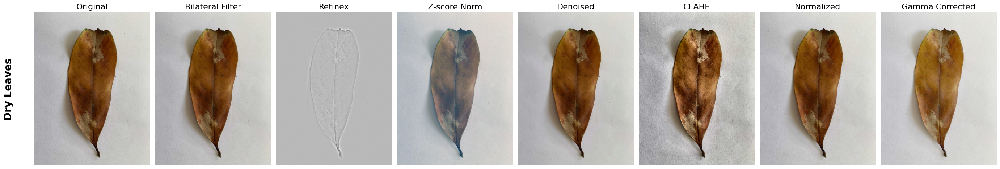

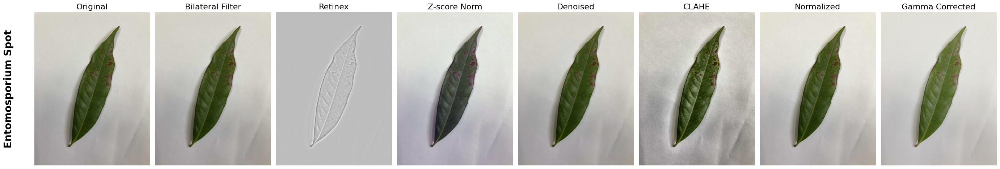

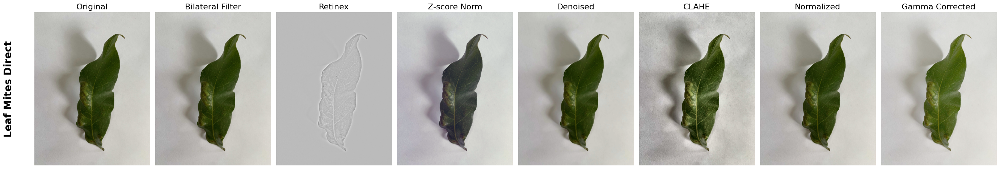

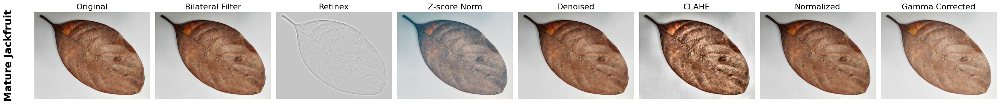

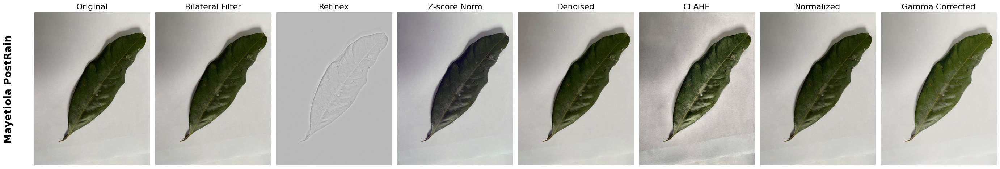

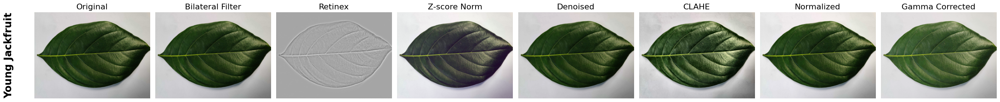

In [3]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

# ✅ Image folder paths by class
image_class_paths = {
    'Algal Spot Indirect': '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Algal Spot Indirect',
    'Anthracnose Cloudy': '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Anthracnose Cloudy',
    'Dry Leaves': '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Dry Leaves',
    'Entomosporium Spot': '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Entomosporium Spot',
    'Leaf Mites Direct': '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Leaf Mites Direct',
    'Mature Jackfruit': '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Mature Jackfruit',
    'Mayetiola PostRain' : '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Mayetiola PostRain',
    'Young Jackfruit': '/content/drive/MyDrive/Combined/Original_Combined_Litchi_Jackfruit/Young Jackfruit'
}

# 🔧 Preprocessing functions
def bilateral_filter(img):
    return cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

def retinex(img):
    img_gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float32)
    img_log = np.log1p(img_gray)
    sigma = 30
    gauss = cv2.GaussianBlur(img_log, (0, 0), sigma)
    retinex_img = img_log - gauss
    retinex_img = cv2.normalize(retinex_img, None, 0, 255, cv2.NORM_MINMAX)
    retinex_img = retinex_img.astype(np.uint8)
    return cv2.cvtColor(retinex_img, cv2.COLOR_GRAY2RGB)

def zscore_norm(img):
    img_float = img.astype(np.float32)
    mean, std = cv2.meanStdDev(img_float)
    mean = mean.reshape((1, 1, 3))
    std = std.reshape((1, 1, 3))
    std[std == 0] = 1.0
    img_norm = (img_float - mean) / std
    img_norm = cv2.normalize(img_norm, None, 0, 255, cv2.NORM_MINMAX)
    return img_norm.astype(np.uint8)

def denoise(img):
    return cv2.fastNlMeansDenoisingColored(img, None, 10, 10, 7, 21)

def clahe(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe_proc = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l = clahe_proc.apply(l)
    lab = cv2.merge((l, a, b))
    return cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)

def normalization(img):
    return cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)

def gamma_correction(img, gamma=1.5):
    invGamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** invGamma * 255 for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(img, table)

# 📂 Process each class folder
for label, folder_path in image_class_paths.items():
    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

    if len(image_files) == 0:
        print(f"❌ No images found in folder: {folder_path}")
        continue

    first_image_path = os.path.join(folder_path, image_files[0])
    img_bgr = cv2.imread(first_image_path)

    if img_bgr is None:
        print(f"❌ Failed to read image: {first_image_path}")
        continue

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    # 📸 Preprocessing set (including Original image)
    aug_images = {
        "Original": img_rgb,
        "Bilateral Filter": bilateral_filter(img_rgb),
        "Retinex": retinex(img_rgb),
        "Z-score Norm": zscore_norm(img_rgb),
        "Denoised": denoise(img_rgb),
        "CLAHE": clahe(img_rgb),
        "Normalized": normalization(img_rgb),
        "Gamma Corrected": gamma_correction(img_rgb)
    }

    # 🎨 Plot preprocessing outputs with larger font
    fig, axs = plt.subplots(1, 8, figsize=(28, 6))
    for idx, (title, image) in enumerate(aug_images.items()):
        axs[idx].imshow(image)
        axs[idx].set_title(title, fontsize=16)  # increased font size for titles
        axs[idx].axis('off')

    # ➕ Label on the left side with bigger font
    fig.text(0.02, 0.5, label, va='center', ha='center', rotation='vertical',
             fontsize=20, color='black', fontweight='bold')  # bigger font

    plt.tight_layout(rect=[0.04, 0, 1, 1])
    plt.show()
